In [3]:
!pip install gensim

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.9/27.9 MB 67.9 MB/s eta 0:00:00


In [5]:
!pip install fuzzywuzzy

In [9]:
!pip install faiss-cpu

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.8/23.8 MB 82.5 MB/s eta 0:00:00


In [21]:
!pip install textstat

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.6/176.6 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 21.0 MB/s eta 0:00:00


In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
from collections import Counter
from nltk.corpus import stopwords
from nltk.tokenize import RegexpTokenizer
from textblob import TextBlob
from wordcloud import WordCloud
from gensim import corpora, models
from fuzzywuzzy import fuzz

/usr/local/lib/python3.12/dist-packages/fuzzywuzzy/fuzz.py:11: UserWarning: Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning
  warnings.warn('Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning')


In [10]:
from sentence_transformers import SentenceTransformer
import faiss

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns

In [13]:
df = pd.read_csv('kaggle_datasets_metadata.csv')

In [14]:
df

,dataset_name,dataset_url,header,about_dataset
0,Extrovert vs. Introvert Behavior Data,https://www.kaggle.com/datasets/rakeshkapilava...,Extrovert vs. Introvert Behavior Data Extrover...,Overview Dive into the Extrovert vs. Introvert...
1,Students' Social Media Addiction,https://www.kaggle.com/datasets/adilshamim8/so...,Students' Social Media Addiction Students' Soc...,TheStudent Social Media & Relationshipsdataset...
2,Global AI Job Market & Salary Trends 2025,https://www.kaggle.com/datasets/bismasajjad/gl...,Global AI Job Market & Salary Trends 2025 Glob...,This comprehensive dataset contains detailed i...
3,🌮 Taco Sales Dataset (2024–2025),https://www.kaggle.com/datasets/atharvasoundan...,🌮 Taco Sales Dataset (2024–2025) 🌮 Taco Sales ...,This dataset contains 1 000 records of synthet...
4,Video Game Sales,https://www.kaggle.com/datasets/siddharth0935/...,Video Game Sales Video Game Sales About Datase...,Video game sales from North America Japan th...
...,...,...,...,...
2395,Employee Attrition,https://www.kaggle.com/datasets/patelprashant/...,Employee Attrition Employee Attrition About Da...,The key to success in any organization is attr...
2396,Micro Expression Dataset for Lie Detection,https://www.kaggle.com/datasets/devvratmathur/...,Micro Expression Dataset for Lie Detection Mic...,Lie detectionis the process of determining whe...
2397,PPE and Heavy Machinery detection (balanced),https://www.kaggle.com/datasets/pablogarcher24...,PPE and Heavy Machinery detection (balanced) P...,This dataset has been prepared for object dete...
2398,Lumbar Coordinate Colorized Dataset,https://www.kaggle.com/datasets/shuvokumarbasa...,Lumbar Coordinate Colorized Dataset Lumbar Coo...,Raw Data Source More Information ::https://w...


In [17]:
def tokenize_unique(row):
    text = f"{row['header']} {row['about_dataset']}"

    # lowercase & extract words only
    tokens = re.findall(r"\b[a-zA-Z]+\b", str(text).lower())

    # unique tokens per row
    return list(set(tokens))

# Apply function
df["tokens"] = df.apply(tokenize_unique, axis=1)

# Preview
df[["header", "about_dataset", "tokens"]].head()

,header,about_dataset,tokens
0,Extrovert vs. Introvert Behavior Data Extrover...,Overview Dive into the Extrovert vs. Introvert...,"[introvert, engagement, making, vs, re, missin..."
1,Students' Social Media Addiction Students' Soc...,TheStudent Social Media & Relationshipsdataset...,"[engagement, relationshipsdataset, student, qu..."
2,Global AI Job Market & Salary Trends 2025 Glob...,This comprehensive dataset contains detailed i...,"[company, creative, engagement, real, business..."
3,🌮 Taco Sales Dataset (2024–2025) 🌮 Taco Sales ...,This dataset contains 1 000 records of synthet...,"[contribution, more, engagement, open, re, del..."
4,Video Game Sales Video Game Sales About Datase...,Video game sales from North America Japan th...,"[more, engagement, world, but, datasets, analy..."


In [18]:
import spacy

# Load spaCy model
nlp = spacy.load("en_core_web_sm")

def lemmatize_tokens(token_list):
    doc = nlp(" ".join(token_list))
    return list(set([token.lemma_ for token in doc if token.is_alpha]))

# Apply lemmatization
df["lemmatized_tokens"] = df["tokens"].apply(lemmatize_tokens)

# Preview
df[["tokens", "lemmatized_tokens"]].head()


,tokens,lemmatized_tokens
0,"[introvert, engagement, making, vs, re, missin...","[introvert, predict, engagement, psychologist,..."
1,"[engagement, relationshipsdataset, student, qu...","[span, engagement, relationshipsdataset, stude..."
2,"[company, creative, engagement, real, business...","[creative, company, business, real, engagement..."
3,"[contribution, more, engagement, open, re, del...","[contribution, more, engagement, open, re, del..."
4,"[more, engagement, world, but, datasets, analy...","[more, engagement, world, grow, but, recommend..."


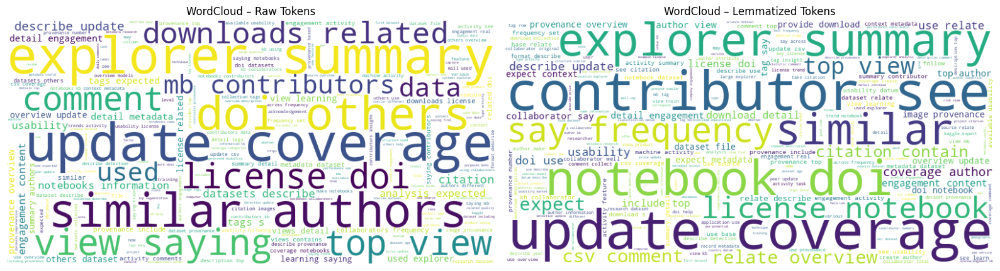

In [19]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Flatten token lists
raw_text = " ".join(token for row in df["tokens"] for token in row)
lemma_text = " ".join(token for row in df["lemmatized_tokens"] for token in row)

# Generate word clouds
wc_raw = WordCloud(
    width=800,
    height=400,
    background_color="white"
).generate(raw_text)

wc_lemma = WordCloud(
    width=800,
    height=400,
    background_color="white"
).generate(lemma_text)

# Plot side by side
plt.figure(figsize=(16, 6))

plt.subplot(1, 2, 1)
plt.imshow(wc_raw, interpolation="bilinear")
plt.axis("off")
plt.title("WordCloud – Raw Tokens")

plt.subplot(1, 2, 2)
plt.imshow(wc_lemma, interpolation="bilinear")
plt.axis("off")
plt.title("WordCloud – Lemmatized Tokens")

plt.tight_layout()
plt.show()


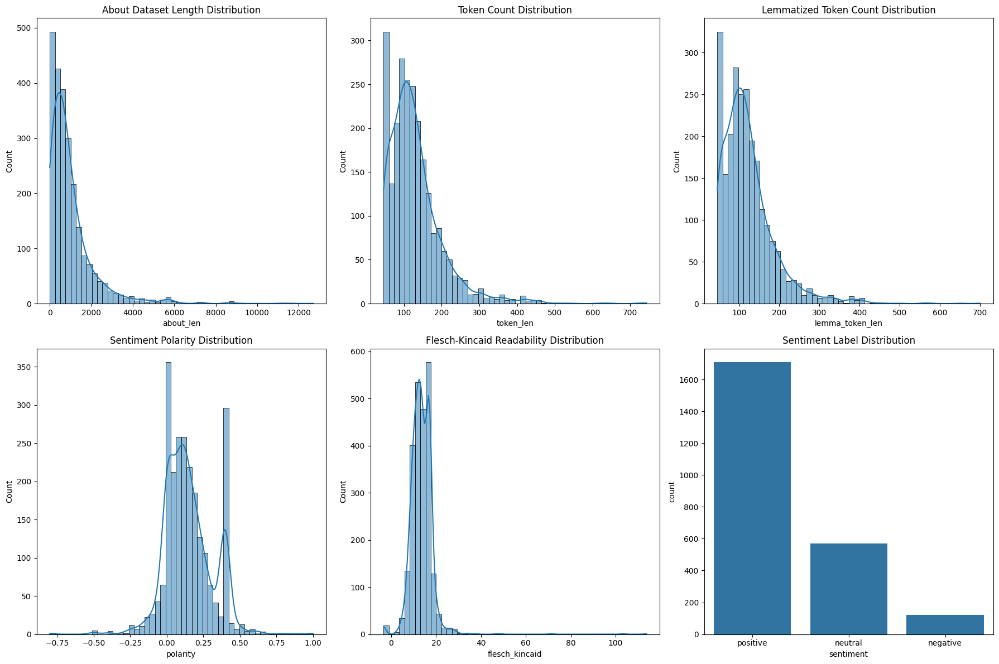

In [22]:
# Install if needed
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from textblob import TextBlob
import textstat

# ---------- Feature Engineering ----------

# Text length
df["about_len"] = df["about_dataset"].astype(str).apply(len)

# Token counts
df["token_len"] = df["tokens"].apply(len)
df["lemma_token_len"] = df["lemmatized_tokens"].apply(len)

# Sentiment polarity
df["polarity"] = df["about_dataset"].astype(str).apply(
    lambda x: TextBlob(x).sentiment.polarity
)

# Sentiment label
def sentiment_label(p):
    if p > 0.05:
        return "positive"
    elif p < -0.05:
        return "negative"
    else:
        return "neutral"

df["sentiment"] = df["polarity"].apply(sentiment_label)

# Flesch-Kincaid readability score
df["flesch_kincaid"] = df["about_dataset"].astype(str).apply(
    lambda x: textstat.flesch_kincaid_grade(x)
)

# ---------- EDA Plots ----------

plt.figure(figsize=(18, 12))

# 1. About dataset length
plt.subplot(2, 3, 1)
sns.histplot(df["about_len"], bins=50, kde=True)
plt.title("About Dataset Length Distribution")

# 2. Token count
plt.subplot(2, 3, 2)
sns.histplot(df["token_len"], bins=50, kde=True)
plt.title("Token Count Distribution")

# 3. Lemmatized token count
plt.subplot(2, 3, 3)
sns.histplot(df["lemma_token_len"], bins=50, kde=True)
plt.title("Lemmatized Token Count Distribution")

# 4. Polarity
plt.subplot(2, 3, 4)
sns.histplot(df["polarity"], bins=50, kde=True)
plt.title("Sentiment Polarity Distribution")

# 5. Flesch-Kincaid score
plt.subplot(2, 3, 5)
sns.histplot(df["flesch_kincaid"], bins=50, kde=True)
plt.title("Flesch-Kincaid Readability Distribution")

# 6. Sentiment labels
plt.subplot(2, 3, 6)
sns.countplot(x=df["sentiment"])
plt.title("Sentiment Label Distribution")

plt.tight_layout()
plt.show()


In [35]:
df

,dataset_name,dataset_url,header,about_dataset,tokens,lemmatized_tokens,about_len,token_len,lemma_token_len,polarity,sentiment,flesch_kincaid
0,Extrovert vs. Introvert Behavior Data,https://www.kaggle.com/datasets/rakeshkapilava...,Extrovert vs. Introvert Behavior Data Extrover...,Overview Dive into the Extrovert vs. Introvert...,"[introvert, engagement, making, vs, re, missin...","[introvert, predict, engagement, psychologist,...",1208,152,145,0.098739,positive,15.018534
1,Students' Social Media Addiction,https://www.kaggle.com/datasets/adilshamim8/so...,Students' Social Media Addiction Students' Soc...,TheStudent Social Media & Relationshipsdataset...,"[engagement, relationshipsdataset, student, qu...","[span, engagement, relationshipsdataset, stude...",771,134,126,0.068519,positive,17.618462
2,Global AI Job Market & Salary Trends 2025,https://www.kaggle.com/datasets/bismasajjad/gl...,Global AI Job Market & Salary Trends 2025 Glob...,This comprehensive dataset contains detailed i...,"[company, creative, engagement, real, business...","[creative, company, business, real, engagement...",1391,181,166,0.167105,positive,15.618508
3,🌮 Taco Sales Dataset (2024–2025),https://www.kaggle.com/datasets/atharvasoundan...,🌮 Taco Sales Dataset (2024–2025) 🌮 Taco Sales ...,This dataset contains 1 000 records of synthet...,"[contribution, more, engagement, open, re, del...","[contribution, more, engagement, open, re, del...",588,114,107,0.297917,positive,11.766149
4,Video Game Sales,https://www.kaggle.com/datasets/siddharth0935/...,Video Game Sales Video Game Sales About Datase...,Video game sales from North America Japan th...,"[more, engagement, world, but, datasets, analy...","[more, engagement, world, grow, but, recommend...",440,101,96,0.273333,positive,7.937222
...,...,...,...,...,...,...,...,...,...,...,...,...
2395,Employee Attrition,https://www.kaggle.com/datasets/patelprashant/...,Employee Attrition Employee Attrition About Da...,The key to success in any organization is attr...,"[company, engagement, content, re, but, low, h...","[company, engagement, content, re, attract, bu...",1240,148,139,0.255733,positive,13.595806
2396,Micro Expression Dataset for Lie Detection,https://www.kaggle.com/datasets/devvratmathur/...,Micro Expression Dataset for Lie Detection Mic...,Lie detectionis the process of determining whe...,"[engagement, detectionis, datasets, describe, ...","[engagement, build, detectionis, datum, identi...",584,112,103,0.129063,positive,11.591471
2397,PPE and Heavy Machinery detection (balanced),https://www.kaggle.com/datasets/pablogarcher24...,PPE and Heavy Machinery detection (balanced) P...,This dataset has been prepared for object dete...,"[tags, expected, field, the, have, engagement,...","[field, the, have, engagement, activity, and, ...",313,65,59,0.000000,neutral,13.143750
2398,Lumbar Coordinate Colorized Dataset,https://www.kaggle.com/datasets/shuvokumarbasa...,Lumbar Coordinate Colorized Dataset Lumbar Coo...,Raw Data Source More Information ::https://w...,"[imaging, fractures, engagement, accordingly, ...","[cue, imaging, engagement, accordingly, aid, t...",5561,418,380,0.044896,neutral,12.878948


In [38]:
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS

stop_words = set(ENGLISH_STOP_WORDS)

df['lemmatized_tokens'] = df['lemmatized_tokens'].apply(
    lambda tokens: [t for t in tokens if t not in stop_words]
    if isinstance(tokens, list) else tokens
)


In [42]:
from collections import Counter
import pandas as pd

# Flatten all token lists into one list
all_tokens = [
    token
    for tokens in df['lemmatized_tokens']
    if isinstance(tokens, list)
    for token in tokens
]

# Count frequencies
top_50 = Counter(all_tokens).most_common(1000)

# Convert to DataFrame
top_50_df = pd.DataFrame(top_50, columns=['word', 'frequency'])

top_50_df


,word,frequency
0,engagement,2400
1,update,2400
2,coverage,2400
3,author,2400
4,usability,2400
5,license,2400
6,doi,2400
7,overview,2400
8,frequency,2400
9,activity,2400


In [43]:
import pandas as pd

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

top_50_df


,word,frequency
0,engagement,2400
1,update,2400
2,coverage,2400
3,author,2400
4,usability,2400
5,license,2400
6,doi,2400
7,overview,2400
8,frequency,2400
9,activity,2400


In [44]:
unique_words = len(
    set(token for tokens in df['lemmatized_tokens'] for token in tokens)
)
unique_words


19367

In [45]:
from collections import Counter

# 1. Find top 30 most frequent words
all_tokens = [t for tokens in df['lemmatized_tokens'] for t in tokens]
top_30_words = {w for w, _ in Counter(all_tokens).most_common(30)}

# 2. Remove them from each row
df['lemmatized_tokens'] = df['lemmatized_tokens'].apply(
    lambda tokens: [t for t in tokens if t not in top_30_words]
)

df['lemmatized_tokens']


,lemmatized_tokens
0,"[introvert, predict, psychologist, vs, environ..."
1,"[span, relationshipsdataset, student, mailing,..."
2,"[creative, company, business, real, internatio..."
3,"[contribution, open, delivery, classification,..."
4,"[world, grow, recommend, analysiswhich, year, ..."
5,"[student, vs, affect, explore, viz, medium, sl..."
6,"[precision, starter, seismic, entire, attach, ..."
7,"[package, grow, delivery, minute, category, pr..."
8,"[modify, ultimate, natural, free, ben, unique,..."
9,"[enhance, anepidemicfeature, theretail, foreca..."


In [46]:
df

,dataset_name,dataset_url,header,about_dataset,tokens,lemmatized_tokens,about_len,token_len,lemma_token_len,polarity,sentiment,flesch_kincaid
0,Extrovert vs. Introvert Behavior Data,https://www.kaggle.com/datasets/rakeshkapilava...,Extrovert vs. Introvert Behavior Data Extrover...,Overview Dive into the Extrovert vs. Introvert...,"[introvert, engagement, making, vs, re, missin...","[introvert, predict, psychologist, vs, environ...",1208,152,145,9.873950e-02,positive,15.018534
1,Students' Social Media Addiction,https://www.kaggle.com/datasets/adilshamim8/so...,Students' Social Media Addiction Students' Soc...,TheStudent Social Media & Relationshipsdataset...,"[engagement, relationshipsdataset, student, qu...","[span, relationshipsdataset, student, mailing,...",771,134,126,6.851852e-02,positive,17.618462
2,Global AI Job Market & Salary Trends 2025,https://www.kaggle.com/datasets/bismasajjad/gl...,Global AI Job Market & Salary Trends 2025 Glob...,This comprehensive dataset contains detailed i...,"[company, creative, engagement, real, business...","[creative, company, business, real, internatio...",1391,181,166,1.671053e-01,positive,15.618508
3,🌮 Taco Sales Dataset (2024–2025),https://www.kaggle.com/datasets/atharvasoundan...,🌮 Taco Sales Dataset (2024–2025) 🌮 Taco Sales ...,This dataset contains 1 000 records of synthet...,"[contribution, more, engagement, open, re, del...","[contribution, open, delivery, classification,...",588,114,107,2.979167e-01,positive,11.766149
4,Video Game Sales,https://www.kaggle.com/datasets/siddharth0935/...,Video Game Sales Video Game Sales About Datase...,Video game sales from North America Japan th...,"[more, engagement, world, but, datasets, analy...","[world, grow, recommend, analysiswhich, year, ...",440,101,96,2.733333e-01,positive,7.937222
5,Student Habits vs Academic Performance,https://www.kaggle.com/datasets/jayaantanaath/...,Student Habits vs Academic Performance Student...,This is a simulated dataset exploring how life...,"[engagement, student, vs, pretending, affect, ...","[student, vs, affect, explore, viz, medium, sl...",757,126,118,2.041667e-01,positive,11.152657
6,OpenFWI Preprocessed 72x72,https://www.kaggle.com/datasets/brendanartley/...,OpenFWI Preprocessed 72x72 OpenFWI Preprocesse...,This dataset is a preprocessed version of the ...,"[tags, expected, attached, the, have, engageme...","[precision, starter, seismic, entire, attach, ...",245,70,66,2.500000e-01,positive,9.588750
7,Zepto Inventory Dataset,https://www.kaggle.com/datasets/palvinder2006/...,Zepto Inventory Dataset Zepto Inventory Datase...,This dataset provides a detailed view of the p...,"[more, engagement, delivery, minute, datasets,...","[package, grow, delivery, minute, category, pr...",401,92,87,1.800000e-01,positive,13.515517
8,Ben 10 Alien Universe — Realistic Battle Dataset,https://www.kaggle.com/datasets/atharvasoundan...,Ben 10 Alien Universe — Realistic Battle Data...,This dataset captures a rich and realistic rep...,"[modify, engagement, natural, free, ben, uniqu...","[modify, ultimate, natural, free, ben, unique,...",1131,137,130,8.677536e-02,positive,11.737712
9,Retail Store Inventory and Demand Forecasting,https://www.kaggle.com/datasets/atomicd/retail...,Retail Store Inventory and Demand Forecasting ...,This dataset follows the format of theRetail S...,"[more, engagement, making, anepidemicfeature, ...","[enhance, anepidemicfeature, theretail, foreca...",406,91,89,3.500000e-01,positive,13.872727


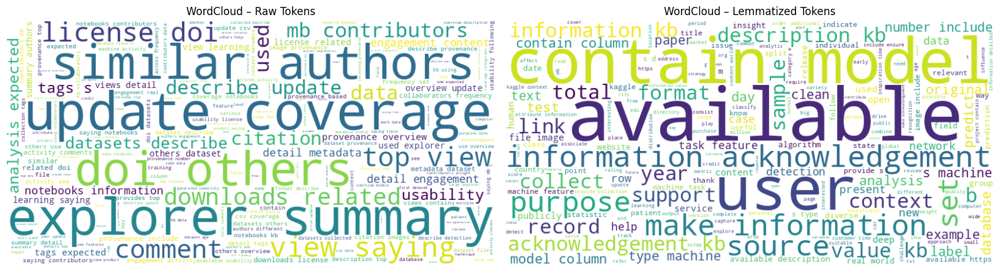

In [47]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Flatten token lists
raw_text = " ".join(token for row in df["tokens"] for token in row)
lemma_text = " ".join(token for row in df["lemmatized_tokens"] for token in row)

# Generate word clouds
wc_raw = WordCloud(
    width=800,
    height=400,
    background_color="white"
).generate(raw_text)

wc_lemma = WordCloud(
    width=800,
    height=400,
    background_color="white"
).generate(lemma_text)

# Plot side by side
plt.figure(figsize=(16, 6))

plt.subplot(1, 2, 1)
plt.imshow(wc_raw, interpolation="bilinear")
plt.axis("off")
plt.title("WordCloud – Raw Tokens")

plt.subplot(1, 2, 2)
plt.imshow(wc_lemma, interpolation="bilinear")
plt.axis("off")
plt.title("WordCloud – Lemmatized Tokens")

plt.tight_layout()
plt.show()


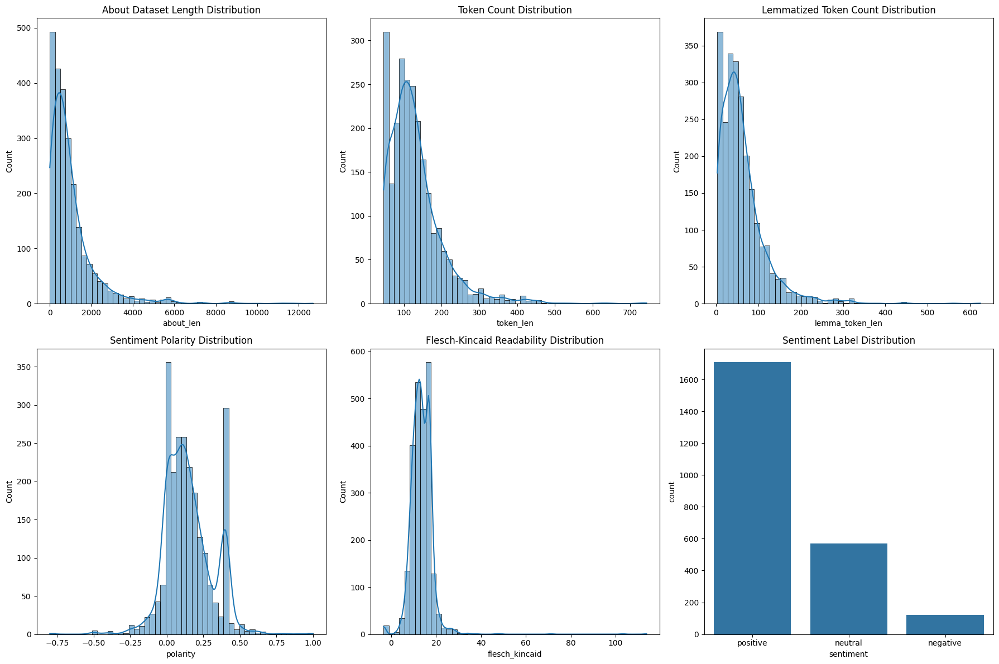

In [48]:
# Install if needed
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from textblob import TextBlob
import textstat

# ---------- Feature Engineering ----------

# Text length
df["about_len"] = df["about_dataset"].astype(str).apply(len)

# Token counts
df["token_len"] = df["tokens"].apply(len)
df["lemma_token_len"] = df["lemmatized_tokens"].apply(len)

# Sentiment polarity
df["polarity"] = df["about_dataset"].astype(str).apply(
    lambda x: TextBlob(x).sentiment.polarity
)

# Sentiment label
def sentiment_label(p):
    if p > 0.05:
        return "positive"
    elif p < -0.05:
        return "negative"
    else:
        return "neutral"

df["sentiment"] = df["polarity"].apply(sentiment_label)

# Flesch-Kincaid readability score
df["flesch_kincaid"] = df["about_dataset"].astype(str).apply(
    lambda x: textstat.flesch_kincaid_grade(x)
)

# ---------- EDA Plots ----------

plt.figure(figsize=(18, 12))

# 1. About dataset length
plt.subplot(2, 3, 1)
sns.histplot(df["about_len"], bins=50, kde=True)
plt.title("About Dataset Length Distribution")

# 2. Token count
plt.subplot(2, 3, 2)
sns.histplot(df["token_len"], bins=50, kde=True)
plt.title("Token Count Distribution")

# 3. Lemmatized token count
plt.subplot(2, 3, 3)
sns.histplot(df["lemma_token_len"], bins=50, kde=True)
plt.title("Lemmatized Token Count Distribution")

# 4. Polarity
plt.subplot(2, 3, 4)
sns.histplot(df["polarity"], bins=50, kde=True)
plt.title("Sentiment Polarity Distribution")

# 5. Flesch-Kincaid score
plt.subplot(2, 3, 5)
sns.histplot(df["flesch_kincaid"], bins=50, kde=True)
plt.title("Flesch-Kincaid Readability Distribution")

# 6. Sentiment labels
plt.subplot(2, 3, 6)
sns.countplot(x=df["sentiment"])
plt.title("Sentiment Label Distribution")

plt.tight_layout()
plt.show()


In [49]:
df

,dataset_name,dataset_url,header,about_dataset,tokens,lemmatized_tokens,about_len,token_len,lemma_token_len,polarity,sentiment,flesch_kincaid
0,Extrovert vs. Introvert Behavior Data,https://www.kaggle.com/datasets/rakeshkapilava...,Extrovert vs. Introvert Behavior Data Extrover...,Overview Dive into the Extrovert vs. Introvert...,"[introvert, engagement, making, vs, re, missin...","[introvert, predict, psychologist, vs, environ...",1208,152,81,9.873950e-02,positive,15.018534
1,Students' Social Media Addiction,https://www.kaggle.com/datasets/adilshamim8/so...,Students' Social Media Addiction Students' Soc...,TheStudent Social Media & Relationshipsdataset...,"[engagement, relationshipsdataset, student, qu...","[span, relationshipsdataset, student, mailing,...",771,134,70,6.851852e-02,positive,17.618462
2,Global AI Job Market & Salary Trends 2025,https://www.kaggle.com/datasets/bismasajjad/gl...,Global AI Job Market & Salary Trends 2025 Glob...,This comprehensive dataset contains detailed i...,"[company, creative, engagement, real, business...","[creative, company, business, real, internatio...",1391,181,102,1.671053e-01,positive,15.618508
3,🌮 Taco Sales Dataset (2024–2025),https://www.kaggle.com/datasets/atharvasoundan...,🌮 Taco Sales Dataset (2024–2025) 🌮 Taco Sales ...,This dataset contains 1 000 records of synthet...,"[contribution, more, engagement, open, re, del...","[contribution, open, delivery, classification,...",588,114,51,2.979167e-01,positive,11.766149
4,Video Game Sales,https://www.kaggle.com/datasets/siddharth0935/...,Video Game Sales Video Game Sales About Datase...,Video game sales from North America Japan th...,"[more, engagement, world, but, datasets, analy...","[world, grow, recommend, analysiswhich, year, ...",440,101,35,2.733333e-01,positive,7.937222
5,Student Habits vs Academic Performance,https://www.kaggle.com/datasets/jayaantanaath/...,Student Habits vs Academic Performance Student...,This is a simulated dataset exploring how life...,"[engagement, student, vs, pretending, affect, ...","[student, vs, affect, explore, viz, medium, sl...",757,126,57,2.041667e-01,positive,11.152657
6,OpenFWI Preprocessed 72x72,https://www.kaggle.com/datasets/brendanartley/...,OpenFWI Preprocessed 72x72 OpenFWI Preprocesse...,This dataset is a preprocessed version of the ...,"[tags, expected, attached, the, have, engageme...","[precision, starter, seismic, entire, attach, ...",245,70,16,2.500000e-01,positive,9.588750
7,Zepto Inventory Dataset,https://www.kaggle.com/datasets/palvinder2006/...,Zepto Inventory Dataset Zepto Inventory Datase...,This dataset provides a detailed view of the p...,"[more, engagement, delivery, minute, datasets,...","[package, grow, delivery, minute, category, pr...",401,92,37,1.800000e-01,positive,13.515517
8,Ben 10 Alien Universe — Realistic Battle Dataset,https://www.kaggle.com/datasets/atharvasoundan...,Ben 10 Alien Universe — Realistic Battle Data...,This dataset captures a rich and realistic rep...,"[modify, engagement, natural, free, ben, uniqu...","[modify, ultimate, natural, free, ben, unique,...",1131,137,69,8.677536e-02,positive,11.737712
9,Retail Store Inventory and Demand Forecasting,https://www.kaggle.com/datasets/atomicd/retail...,Retail Store Inventory and Demand Forecasting ...,This dataset follows the format of theRetail S...,"[more, engagement, making, anepidemicfeature, ...","[enhance, anepidemicfeature, theretail, foreca...",406,91,34,3.500000e-01,positive,13.872727


In [60]:
from sentence_transformers import SentenceTransformer, util
from tqdm import tqdm
import pandas as pd

tqdm.pandas()

# ----------------------------
# 1. LOAD MODEL
# ----------------------------
model = SentenceTransformer("all-MiniLM-L6-v2")

# ----------------------------
# 2. DESCRIPTIVE LABELS (IMPORTANT)
# ----------------------------
labels = {
    "healthcare": "healthcare medical hospitals diseases patients public health",
    "technology": "technology software computers artificial intelligence data",
    "finance": "finance banking stock market investment economics money",
    "education": "education schools universities learning students courses",
    "environment": "environment climate change pollution sustainability nature",
    "sports": "sports football cricket olympics athletes games"
}

label_names = list(labels.keys())
label_texts = list(labels.values())

# Encode labels ONCE
label_emb = model.encode(label_texts, convert_to_tensor=True)

# ----------------------------
# 3. PREPARE TEXT (TRUNCATE)
# ----------------------------
MAX_WORDS = 200

df['text'] = (
    df['dataset_name'].fillna('') + " " +
    df['about_dataset'].fillna('')
).str.split().str[:MAX_WORDS].str.join(' ')

# ----------------------------
# 4. CLASSIFIER WITH THRESHOLD
# ----------------------------
THRESHOLD = 0.25

def classify(text):
    emb = model.encode(text, convert_to_tensor=True)
    scores = util.cos_sim(emb, label_emb)[0]
    max_score, idx = scores.max().item(), scores.argmax().item()
    return label_names[idx] if max_score >= THRESHOLD else "other"

# ----------------------------
# 5. APPLY WITH TQDM
# ----------------------------
df['category'] = df['text'].progress_apply(classify)

# ----------------------------
# 6. OPTIONAL: VIEW RESULT
# ----------------------------
df[['dataset_name', 'category']].head()


100%|██████████| 2400/2400 [03:42<00:00, 10.77it/s]


,dataset_name,category
0,Extrovert vs. Introvert Behavior Data,other
1,Students' Social Media Addiction,other
2,Global AI Job Market & Salary Trends 2025,technology
3,🌮 Taco Sales Dataset (2024–2025),technology
4,Video Game Sales,other


In [61]:
df

,dataset_name,dataset_url,header,about_dataset,tokens,lemmatized_tokens,about_len,token_len,lemma_token_len,polarity,sentiment,flesch_kincaid,text_for_classification,text,category
0,Extrovert vs. Introvert Behavior Data,https://www.kaggle.com/datasets/rakeshkapilava...,Extrovert vs. Introvert Behavior Data Extrover...,Overview Dive into the Extrovert vs. Introvert...,"[introvert, engagement, making, vs, re, missin...","[introvert, predict, psychologist, vs, environ...",1208,152,81,9.873950e-02,positive,15.018534,Extrovert vs. Introvert Behavior Data Overview...,Extrovert vs. Introvert Behavior Data Overview...,other
1,Students' Social Media Addiction,https://www.kaggle.com/datasets/adilshamim8/so...,Students' Social Media Addiction Students' Soc...,TheStudent Social Media & Relationshipsdataset...,"[engagement, relationshipsdataset, student, qu...","[span, relationshipsdataset, student, mailing,...",771,134,70,6.851852e-02,positive,17.618462,Students' Social Media Addiction TheStudent So...,Students' Social Media Addiction TheStudent So...,other
2,Global AI Job Market & Salary Trends 2025,https://www.kaggle.com/datasets/bismasajjad/gl...,Global AI Job Market & Salary Trends 2025 Glob...,This comprehensive dataset contains detailed i...,"[company, creative, engagement, real, business...","[creative, company, business, real, internatio...",1391,181,102,1.671053e-01,positive,15.618508,Global AI Job Market & Salary Trends 2025 This...,Global AI Job Market & Salary Trends 2025 This...,technology
3,🌮 Taco Sales Dataset (2024–2025),https://www.kaggle.com/datasets/atharvasoundan...,🌮 Taco Sales Dataset (2024–2025) 🌮 Taco Sales ...,This dataset contains 1 000 records of synthet...,"[contribution, more, engagement, open, re, del...","[contribution, open, delivery, classification,...",588,114,51,2.979167e-01,positive,11.766149,🌮 Taco Sales Dataset (2024–2025) This dataset ...,🌮 Taco Sales Dataset (2024–2025) This dataset ...,technology
4,Video Game Sales,https://www.kaggle.com/datasets/siddharth0935/...,Video Game Sales Video Game Sales About Datase...,Video game sales from North America Japan th...,"[more, engagement, world, but, datasets, analy...","[world, grow, recommend, analysiswhich, year, ...",440,101,35,2.733333e-01,positive,7.937222,Video Game Sales Video game sales from North A...,Video Game Sales Video game sales from North A...,other
5,Student Habits vs Academic Performance,https://www.kaggle.com/datasets/jayaantanaath/...,Student Habits vs Academic Performance Student...,This is a simulated dataset exploring how life...,"[engagement, student, vs, pretending, affect, ...","[student, vs, affect, explore, viz, medium, sl...",757,126,57,2.041667e-01,positive,11.152657,Student Habits vs Academic Performance This is...,Student Habits vs Academic Performance This is...,education
6,OpenFWI Preprocessed 72x72,https://www.kaggle.com/datasets/brendanartley/...,OpenFWI Preprocessed 72x72 OpenFWI Preprocesse...,This dataset is a preprocessed version of the ...,"[tags, expected, attached, the, have, engageme...","[precision, starter, seismic, entire, attach, ...",245,70,16,2.500000e-01,positive,9.588750,OpenFWI Preprocessed 72x72 This dataset is a p...,OpenFWI Preprocessed 72x72 This dataset is a p...,other
7,Zepto Inventory Dataset,https://www.kaggle.com/datasets/palvinder2006/...,Zepto Inventory Dataset Zepto Inventory Datase...,This dataset provides a detailed view of the p...,"[more, engagement, delivery, minute, datasets,...","[package, grow, delivery, minute, category, pr...",401,92,37,1.800000e-01,positive,13.515517,Zepto Inventory Dataset This dataset provides ...,Zepto Inventory Dataset This dataset provides ...,technology
8,Ben 10 Alien Universe — Realistic Battle Dataset,https://www.kaggle.com/datasets/atharvasoundan...,Ben 10 Alien Universe — Realistic Battle Data...,This dataset captures a rich and realistic rep...,"[modify, engagement, natural, free, ben, uniqu...","[modify, ultimate, natural, free, ben, unique,...",1131,13

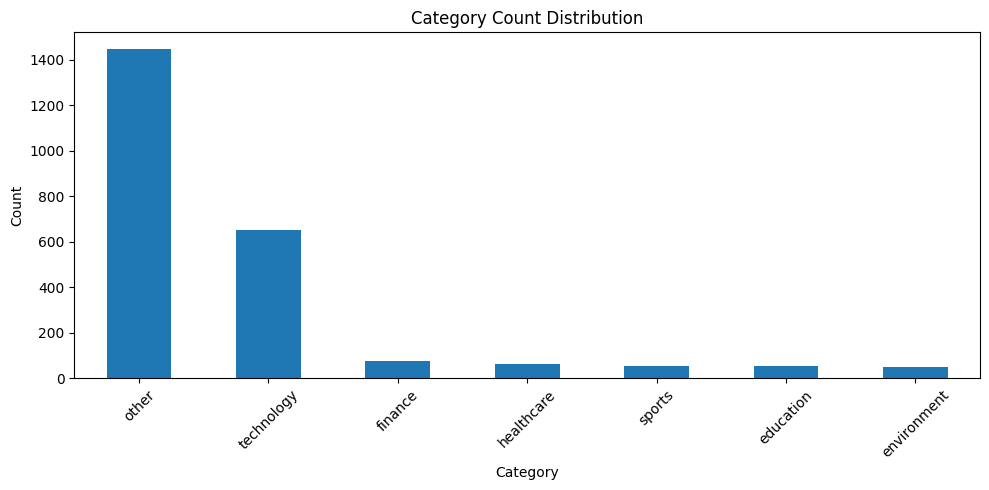

In [62]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
df['category'].value_counts().plot(kind='bar')
plt.title("Category Count Distribution")
plt.xlabel("Category")
plt.ylabel("Count")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [63]:
pd.reset_option('display.max_rows')


In [64]:
df

,dataset_name,dataset_url,header,about_dataset,tokens,lemmatized_tokens,about_len,token_len,lemma_token_len,polarity,sentiment,flesch_kincaid,text_for_classification,text,category
0,Extrovert vs. Introvert Behavior Data,https://www.kaggle.com/datasets/rakeshkapilava...,Extrovert vs. Introvert Behavior Data Extrover...,Overview Dive into the Extrovert vs. Introvert...,"[introvert, engagement, making, vs, re, missin...","[introvert, predict, psychologist, vs, environ...",1208,152,81,0.098739,positive,15.018534,Extrovert vs. Introvert Behavior Data Overview...,Extrovert vs. Introvert Behavior Data Overview...,other
1,Students' Social Media Addiction,https://www.kaggle.com/datasets/adilshamim8/so...,Students' Social Media Addiction Students' Soc...,TheStudent Social Media & Relationshipsdataset...,"[engagement, relationshipsdataset, student, qu...","[span, relationshipsdataset, student, mailing,...",771,134,70,0.068519,positive,17.618462,Students' Social Media Addiction TheStudent So...,Students' Social Media Addiction TheStudent So...,other
2,Global AI Job Market & Salary Trends 2025,https://www.kaggle.com/datasets/bismasajjad/gl...,Global AI Job Market & Salary Trends 2025 Glob...,This comprehensive dataset contains detailed i...,"[company, creative, engagement, real, business...","[creative, company, business, real, internatio...",1391,181,102,0.167105,positive,15.618508,Global AI Job Market & Salary Trends 2025 This...,Global AI Job Market & Salary Trends 2025 This...,technology
3,🌮 Taco Sales Dataset (2024–2025),https://www.kaggle.com/datasets/atharvasoundan...,🌮 Taco Sales Dataset (2024–2025) 🌮 Taco Sales ...,This dataset contains 1 000 records of synthet...,"[contribution, more, engagement, open, re, del...","[contribution, open, delivery, classification,...",588,114,51,0.297917,positive,11.766149,🌮 Taco Sales Dataset (2024–2025) This dataset ...,🌮 Taco Sales Dataset (2024–2025) This dataset ...,technology
4,Video Game Sales,https://www.kaggle.com/datasets/siddharth0935/...,Video Game Sales Video Game Sales About Datase...,Video game sales from North America Japan th...,"[more, engagement, world, but, datasets, analy...","[world, grow, recommend, analysiswhich, year, ...",440,101,35,0.273333,positive,7.937222,Video Game Sales Video game sales from North A...,Video Game Sales Video game sales from North A...,other
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2395,Employee Attrition,https://www.kaggle.com/datasets/patelprashant/...,Employee Attrition Employee Attrition About Da...,The key to success in any organization is attr...,"[company, engagement, content, re, but, low, h...","[company, content, attract, low, https, workfo...",1240,148,64,0.255733,positive,13.595806,Employee Attrition The key to success in any o...,Employee Attrition The key to success in any o...,technology
2396,Micro Expression Dataset for Lie Detection,https://www.kaggle.com/datasets/devvratmathur/...,Micro Expression Dataset for Lie Detection Mic...,Lie detectionis the process of determining whe...,"[engagement, detectionis, datasets, describe, ...","[build, detectionis, identify, detection, micr...",584,112,39,0.129063,positive,11.591471,Micro Expression Dataset for Lie Detection Lie...,Micro Expression Dataset for Lie Detection Lie...,other
2397,PPE and Heavy Machinery detection (balanced),https://www.kaggle.com/datasets/pablogarcher24...,PPE and Heavy Machinery detection (balanced) P...,This dataset has been prepared for object dete...,"[tags, expected, field, the, have, engagement,...","[field, ppe, object, mask, file, detection, co...",313,65,15,0.000000,neutral,13.143750,PPE and Heavy Machinery detection (balanced) T...,PPE and Heavy Machinery detection (balanced) T...,other
2398,Lumbar Coordinate Colorized Dataset,https://www.kaggle.com/datasets/shuvokumarbasa...,Lumbar Coordinate Colorized Dataset Lumbar Coo...,Raw Data Source More Information ::https://w...,"[imaging, fractures, engagement, accordingly, ...","[cue, imaging

In [65]:
df['flesch_kincaid'].min(), df['flesch_kincaid'].max()


(-3.3999999999999986, 113.80000000000001)

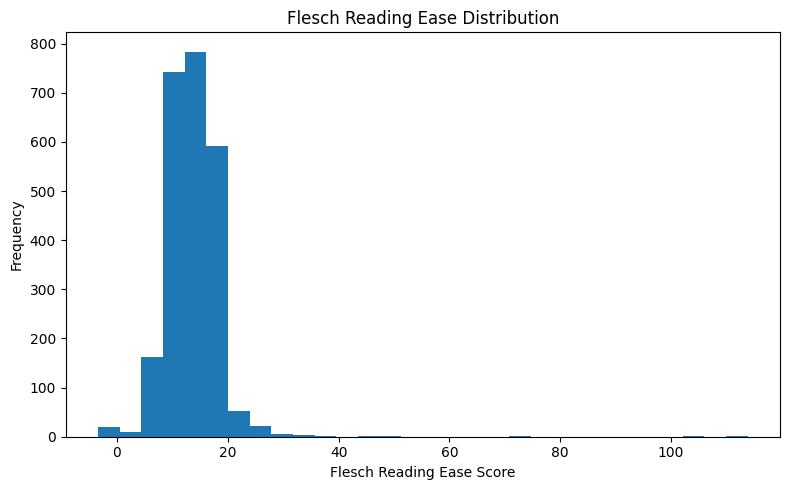

In [66]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
plt.hist(df['flesch_kincaid'], bins=30)
plt.title("Flesch Reading Ease Distribution")
plt.xlabel("Flesch Reading Ease Score")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()


In [67]:
def assign_level(score):
    if score < 12:
        return "easy"
    elif score < 20:
        return "medium"
    else:
        return "hard"

df['reading_level'] = df['flesch_kincaid'].apply(assign_level)


In [68]:
df['reading_level'].value_counts()


,count
reading_level,
medium,1426
easy,883
hard,91


In [69]:
df

,dataset_name,dataset_url,header,about_dataset,tokens,lemmatized_tokens,about_len,token_len,lemma_token_len,polarity,sentiment,flesch_kincaid,text_for_classification,text,category,reading_level
0,Extrovert vs. Introvert Behavior Data,https://www.kaggle.com/datasets/rakeshkapilava...,Extrovert vs. Introvert Behavior Data Extrover...,Overview Dive into the Extrovert vs. Introvert...,"[introvert, engagement, making, vs, re, missin...","[introvert, predict, psychologist, vs, environ...",1208,152,81,0.098739,positive,15.018534,Extrovert vs. Introvert Behavior Data Overview...,Extrovert vs. Introvert Behavior Data Overview...,other,medium
1,Students' Social Media Addiction,https://www.kaggle.com/datasets/adilshamim8/so...,Students' Social Media Addiction Students' Soc...,TheStudent Social Media & Relationshipsdataset...,"[engagement, relationshipsdataset, student, qu...","[span, relationshipsdataset, student, mailing,...",771,134,70,0.068519,positive,17.618462,Students' Social Media Addiction TheStudent So...,Students' Social Media Addiction TheStudent So...,other,medium
2,Global AI Job Market & Salary Trends 2025,https://www.kaggle.com/datasets/bismasajjad/gl...,Global AI Job Market & Salary Trends 2025 Glob...,This comprehensive dataset contains detailed i...,"[company, creative, engagement, real, business...","[creative, company, business, real, internatio...",1391,181,102,0.167105,positive,15.618508,Global AI Job Market & Salary Trends 2025 This...,Global AI Job Market & Salary Trends 2025 This...,technology,medium
3,🌮 Taco Sales Dataset (2024–2025),https://www.kaggle.com/datasets/atharvasoundan...,🌮 Taco Sales Dataset (2024–2025) 🌮 Taco Sales ...,This dataset contains 1 000 records of synthet...,"[contribution, more, engagement, open, re, del...","[contribution, open, delivery, classification,...",588,114,51,0.297917,positive,11.766149,🌮 Taco Sales Dataset (2024–2025) This dataset ...,🌮 Taco Sales Dataset (2024–2025) This dataset ...,technology,easy
4,Video Game Sales,https://www.kaggle.com/datasets/siddharth0935/...,Video Game Sales Video Game Sales About Datase...,Video game sales from North America Japan th...,"[more, engagement, world, but, datasets, analy...","[world, grow, recommend, analysiswhich, year, ...",440,101,35,0.273333,positive,7.937222,Video Game Sales Video game sales from North A...,Video Game Sales Video game sales from North A...,other,easy
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2395,Employee Attrition,https://www.kaggle.com/datasets/patelprashant/...,Employee Attrition Employee Attrition About Da...,The key to success in any organization is attr...,"[company, engagement, content, re, but, low, h...","[company, content, attract, low, https, workfo...",1240,148,64,0.255733,positive,13.595806,Employee Attrition The key to success in any o...,Employee Attrition The key to success in any o...,technology,medium
2396,Micro Expression Dataset for Lie Detection,https://www.kaggle.com/datasets/devvratmathur/...,Micro Expression Dataset for Lie Detection Mic...,Lie detectionis the process of determining whe...,"[engagement, detectionis, datasets, describe, ...","[build, detectionis, identify, detection, micr...",584,112,39,0.129063,positive,11.591471,Micro Expression Dataset for Lie Detection Lie...,Micro Expression Dataset for Lie Detection Lie...,other,easy
2397,PPE and Heavy Machinery detection (balanced),https://www.kaggle.com/datasets/pablogarcher24...,PPE and Heavy Machinery detection (balanced) P...,This dataset has been prepared for object dete...,"[tags, expected, field, the, have, engagement,...","[field, ppe, object, mask, file, detection, co...",313,65,15,0.000000,neutral,13.143750,PPE and Heavy Machinery detection (balanced) T...,PPE and Heavy Machinery detection (balanced) T...,other,medium
2398,Lumbar Coordinate Colorized Dataset,https://www.kaggle.com/datasets/shuvokumarbasa...,Lumbar Coordinate Colorized Dataset Lumbar Coo...,Raw Data Source More Information ::https://w..

In [70]:
df['polarity'].min(), df['polarity'].max()


(-0.8, 1.0)

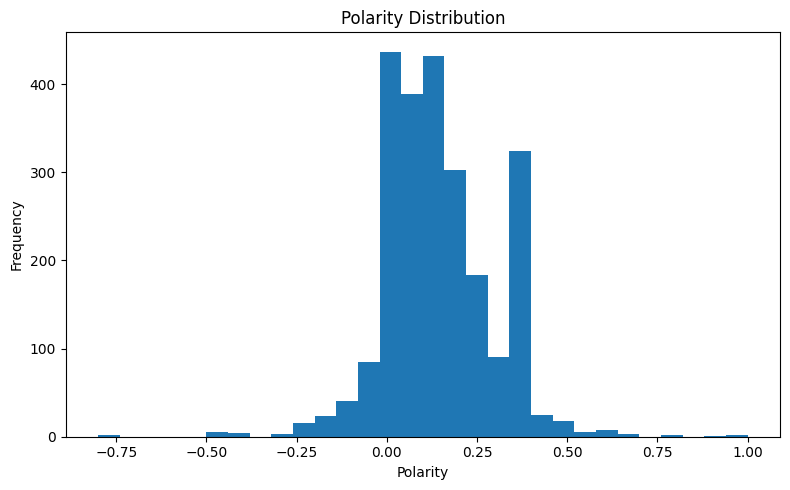

In [71]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
plt.hist(df['polarity'], bins=30)
plt.title("Polarity Distribution")
plt.xlabel("Polarity")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()


In [72]:
from textblob import TextBlob

df['subjectivity'] = df['about_dataset'].fillna('').apply(
    lambda x: TextBlob(x).sentiment.subjectivity
)


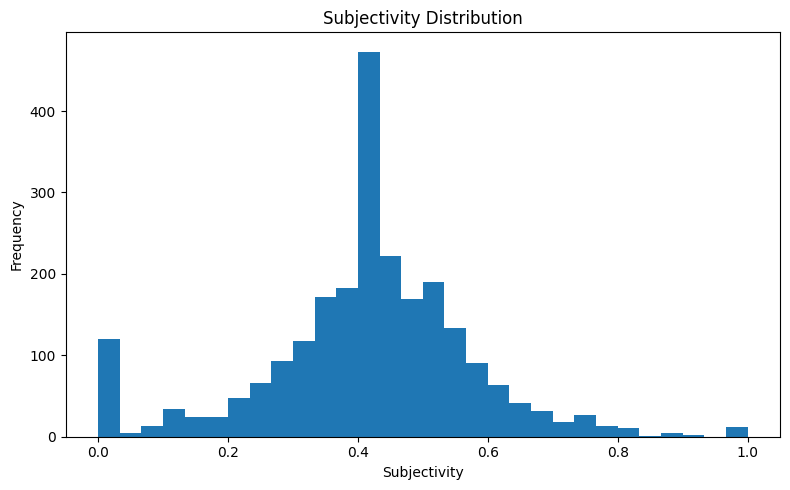

In [73]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
plt.hist(df['subjectivity'], bins=30)
plt.title("Subjectivity Distribution")
plt.xlabel("Subjectivity")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()


In [74]:
def subjectivity_bucket(s):
    if s < 0.3:
        return "factual"
    elif s < 0.6:
        return "mixed"
    else:
        return "opinionated"

df['subjectivity_level'] = df['subjectivity'].apply(subjectivity_bucket)


In [75]:
df['subjectivity_level'].value_counts()


,count
subjectivity_level,
mixed,1750
factual,426
opinionated,224


In [76]:
df

,dataset_name,dataset_url,header,about_dataset,tokens,lemmatized_tokens,about_len,token_len,lemma_token_len,polarity,sentiment,flesch_kincaid,text_for_classification,text,category,reading_level,subjectivity,subjectivity_level
0,Extrovert vs. Introvert Behavior Data,https://www.kaggle.com/datasets/rakeshkapilava...,Extrovert vs. Introvert Behavior Data Extrover...,Overview Dive into the Extrovert vs. Introvert...,"[introvert, engagement, making, vs, re, missin...","[introvert, predict, psychologist, vs, environ...",1208,152,81,0.098739,positive,15.018534,Extrovert vs. Introvert Behavior Data Overview...,Extrovert vs. Introvert Behavior Data Overview...,other,medium,0.372899,mixed
1,Students' Social Media Addiction,https://www.kaggle.com/datasets/adilshamim8/so...,Students' Social Media Addiction Students' Soc...,TheStudent Social Media & Relationshipsdataset...,"[engagement, relationshipsdataset, student, qu...","[span, relationshipsdataset, student, mailing,...",771,134,70,0.068519,positive,17.618462,Students' Social Media Addiction TheStudent So...,Students' Social Media Addiction TheStudent So...,other,medium,0.309259,mixed
2,Global AI Job Market & Salary Trends 2025,https://www.kaggle.com/datasets/bismasajjad/gl...,Global AI Job Market & Salary Trends 2025 Glob...,This comprehensive dataset contains detailed i...,"[company, creative, engagement, real, business...","[creative, company, business, real, internatio...",1391,181,102,0.167105,positive,15.618508,Global AI Job Market & Salary Trends 2025 This...,Global AI Job Market & Salary Trends 2025 This...,technology,medium,0.541228,mixed
3,🌮 Taco Sales Dataset (2024–2025),https://www.kaggle.com/datasets/atharvasoundan...,🌮 Taco Sales Dataset (2024–2025) 🌮 Taco Sales ...,This dataset contains 1 000 records of synthet...,"[contribution, more, engagement, open, re, del...","[contribution, open, delivery, classification,...",588,114,51,0.297917,positive,11.766149,🌮 Taco Sales Dataset (2024–2025) This dataset ...,🌮 Taco Sales Dataset (2024–2025) This dataset ...,technology,easy,0.547917,mixed
4,Video Game Sales,https://www.kaggle.com/datasets/siddharth0935/...,Video Game Sales Video Game Sales About Datase...,Video game sales from North America Japan th...,"[more, engagement, world, but, datasets, analy...","[world, grow, recommend, analysiswhich, year, ...",440,101,35,0.273333,positive,7.937222,Video Game Sales Video game sales from North A...,Video Game Sales Video game sales from North A...,other,easy,0.526667,mixed
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2395,Employee Attrition,https://www.kaggle.com/datasets/patelprashant/...,Employee Attrition Employee Attrition About Da...,The key to success in any organization is attr...,"[company, engagement, content, re, but, low, h...","[company, content, attract, low, https, workfo...",1240,148,64,0.255733,positive,13.595806,Employee Attrition The key to success in any o...,Employee Attrition The key to success in any o...,technology,medium,0.525322,mixed
2396,Micro Expression Dataset for Lie Detection,https://www.kaggle.com/datasets/devvratmathur/...,Micro Expression Dataset for Lie Detection Mic...,Lie detectionis the process of determining whe...,"[engagement, detectionis, datasets, describe, ...","[build, detectionis, identify, detection, micr...",584,112,39,0.129063,positive,11.591471,Micro Expression Dataset for Lie Detection Lie...,Micro Expression Dataset for Lie Detection Lie...,other,easy,0.385262,mixed
2397,PPE and Heavy Machinery detection (balanced),https://www.kaggle.com/datasets/pablogarcher24...,PPE and Heavy Machinery detection (balanced) P...,This dataset has been prepared for object dete...,"[tags, expected, field, the, have, engagement,...","[field, ppe, object, mask, file, detection, co...",313,65,15,0.000000,neutral,13.143750,PPE and Heavy Machinery detection (balanced) T...,PPE and Heavy Machinery detection (balanced) T...,other,medium,0.100000,factual
2398,Lumbar Coordinate Co

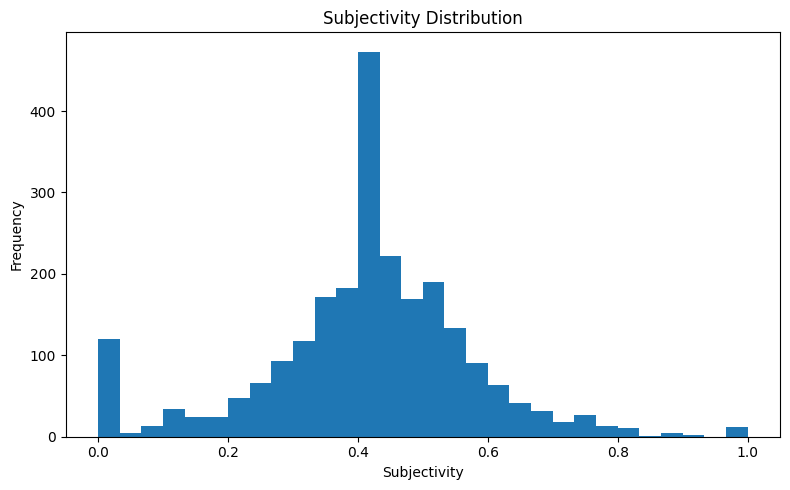

In [77]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
plt.hist(df['subjectivity'], bins=30)
plt.title("Subjectivity Distribution")
plt.xlabel("Subjectivity")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()


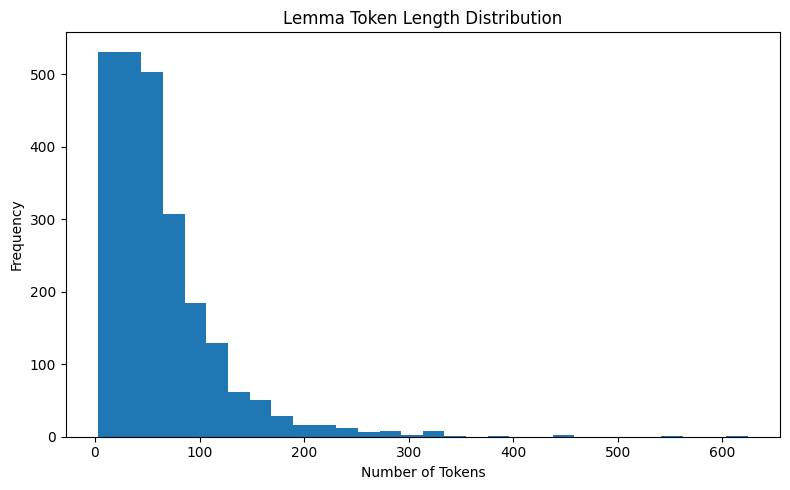

In [78]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
plt.hist(df['lemma_token_len'], bins=30)
plt.title("Lemma Token Length Distribution")
plt.xlabel("Number of Tokens")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()


In [79]:
def lemma_len_bucket(n):
    if n < 50:
        return "short"
    elif n < 150:
        return "medium"
    else:
        return "long"

df['lemma_len_bucket'] = df['lemma_token_len'].apply(lemma_len_bucket)


In [80]:
df['lemma_len_bucket'].value_counts()


,count
lemma_len_bucket,
short,1186
medium,1066
long,148


In [81]:
df

,dataset_name,dataset_url,header,about_dataset,tokens,lemmatized_tokens,about_len,token_len,lemma_token_len,polarity,sentiment,flesch_kincaid,text_for_classification,text,category,reading_level,subjectivity,subjectivity_level,lemma_len_bucket
0,Extrovert vs. Introvert Behavior Data,https://www.kaggle.com/datasets/rakeshkapilava...,Extrovert vs. Introvert Behavior Data Extrover...,Overview Dive into the Extrovert vs. Introvert...,"[introvert, engagement, making, vs, re, missin...","[introvert, predict, psychologist, vs, environ...",1208,152,81,0.098739,positive,15.018534,Extrovert vs. Introvert Behavior Data Overview...,Extrovert vs. Introvert Behavior Data Overview...,other,medium,0.372899,mixed,medium
1,Students' Social Media Addiction,https://www.kaggle.com/datasets/adilshamim8/so...,Students' Social Media Addiction Students' Soc...,TheStudent Social Media & Relationshipsdataset...,"[engagement, relationshipsdataset, student, qu...","[span, relationshipsdataset, student, mailing,...",771,134,70,0.068519,positive,17.618462,Students' Social Media Addiction TheStudent So...,Students' Social Media Addiction TheStudent So...,other,medium,0.309259,mixed,medium
2,Global AI Job Market & Salary Trends 2025,https://www.kaggle.com/datasets/bismasajjad/gl...,Global AI Job Market & Salary Trends 2025 Glob...,This comprehensive dataset contains detailed i...,"[company, creative, engagement, real, business...","[creative, company, business, real, internatio...",1391,181,102,0.167105,positive,15.618508,Global AI Job Market & Salary Trends 2025 This...,Global AI Job Market & Salary Trends 2025 This...,technology,medium,0.541228,mixed,medium
3,🌮 Taco Sales Dataset (2024–2025),https://www.kaggle.com/datasets/atharvasoundan...,🌮 Taco Sales Dataset (2024–2025) 🌮 Taco Sales ...,This dataset contains 1 000 records of synthet...,"[contribution, more, engagement, open, re, del...","[contribution, open, delivery, classification,...",588,114,51,0.297917,positive,11.766149,🌮 Taco Sales Dataset (2024–2025) This dataset ...,🌮 Taco Sales Dataset (2024–2025) This dataset ...,technology,easy,0.547917,mixed,medium
4,Video Game Sales,https://www.kaggle.com/datasets/siddharth0935/...,Video Game Sales Video Game Sales About Datase...,Video game sales from North America Japan th...,"[more, engagement, world, but, datasets, analy...","[world, grow, recommend, analysiswhich, year, ...",440,101,35,0.273333,positive,7.937222,Video Game Sales Video game sales from North A...,Video Game Sales Video game sales from North A...,other,easy,0.526667,mixed,short
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2395,Employee Attrition,https://www.kaggle.com/datasets/patelprashant/...,Employee Attrition Employee Attrition About Da...,The key to success in any organization is attr...,"[company, engagement, content, re, but, low, h...","[company, content, attract, low, https, workfo...",1240,148,64,0.255733,positive,13.595806,Employee Attrition The key to success in any o...,Employee Attrition The key to success in any o...,technology,medium,0.525322,mixed,medium
2396,Micro Expression Dataset for Lie Detection,https://www.kaggle.com/datasets/devvratmathur/...,Micro Expression Dataset for Lie Detection Mic...,Lie detectionis the process of determining whe...,"[engagement, detectionis, datasets, describe, ...","[build, detectionis, identify, detection, micr...",584,112,39,0.129063,positive,11.591471,Micro Expression Dataset for Lie Detection Lie...,Micro Expression Dataset for Lie Detection Lie...,other,easy,0.385262,mixed,short
2397,PPE and Heavy Machinery detection (balanced),https://www.kaggle.com/datasets/pablogarcher24...,PPE and Heavy Machinery detection (balanced) P...,This dataset has been prepared for object dete...,"[tags, expected, field, the, have, engagement,...","[field, ppe, object, mask, file, detection, co...",313,65,15,0.000000,neutral,13.143750,PPE and Heavy Machinery detection (balanced) T...,PPE and Heavy Machinery detection (ba

In [82]:
def build_weighted_text(row):
    # 80% weight → repeat tokens more
    tokens_text = " ".join(row['lemmatized_tokens']) if isinstance(row['lemmatized_tokens'], list) else ""
    tokens_weighted = (" " + tokens_text) * 8   # 8 parts out of 10

    # Remaining metadata (1 part each)
    meta_parts = [
        f"length {row['lemma_len_bucket']}",
        f"subjectivity {row['subjectivity_level']}",
        f"reading {row['reading_level']}",
        f"category {row['category']}",
        f"sentiment {row['sentiment']}"
    ]
    meta_text = " ".join(meta_parts) * 2  # 2 parts out of 10

    return tokens_weighted + " " + meta_text


In [83]:
df['combined_text'] = df.apply(build_weighted_text, axis=1)


In [84]:
from sentence_transformers import SentenceTransformer

model = SentenceTransformer('all-MiniLM-L6-v2')

embeddings = model.encode(
    df['combined_text'].tolist(),
    show_progress_bar=True
)


Batches:   0%|          | 0/75 [00:00<?, ?it/s]

In [85]:
import faiss
import numpy as np

dimension = embeddings.shape[1]
index = faiss.IndexFlatL2(dimension)

index.add(np.array(embeddings).astype('float32'))

faiss.write_index(index, 'dataset_indexq.faiss')


In [86]:
df.to_csv('metadata_with_embeddings1.csv', index=False)


In [87]:
df

,dataset_name,dataset_url,header,about_dataset,tokens,lemmatized_tokens,about_len,token_len,lemma_token_len,polarity,sentiment,flesch_kincaid,text_for_classification,text,category,reading_level,subjectivity,subjectivity_level,lemma_len_bucket,combined_text
0,Extrovert vs. Introvert Behavior Data,https://www.kaggle.com/datasets/rakeshkapilava...,Extrovert vs. Introvert Behavior Data Extrover...,Overview Dive into the Extrovert vs. Introvert...,"[introvert, engagement, making, vs, re, missin...","[introvert, predict, psychologist, vs, environ...",1208,152,81,0.098739,positive,15.018534,Extrovert vs. Introvert Behavior Data Overview...,Extrovert vs. Introvert Behavior Data Overview...,other,medium,0.372899,mixed,medium,introvert predict psychologist vs environment...
1,Students' Social Media Addiction,https://www.kaggle.com/datasets/adilshamim8/so...,Students' Social Media Addiction Students' Soc...,TheStudent Social Media & Relationshipsdataset...,"[engagement, relationshipsdataset, student, qu...","[span, relationshipsdataset, student, mailing,...",771,134,70,0.068519,positive,17.618462,Students' Social Media Addiction TheStudent So...,Students' Social Media Addiction TheStudent So...,other,medium,0.309259,mixed,medium,span relationshipsdataset student mailing lev...
2,Global AI Job Market & Salary Trends 2025,https://www.kaggle.com/datasets/bismasajjad/gl...,Global AI Job Market & Salary Trends 2025 Glob...,This comprehensive dataset contains detailed i...,"[company, creative, engagement, real, business...","[creative, company, business, real, internatio...",1391,181,102,0.167105,positive,15.618508,Global AI Job Market & Salary Trends 2025 This...,Global AI Job Market & Salary Trends 2025 This...,technology,medium,0.541228,mixed,medium,creative company business real international ...
3,🌮 Taco Sales Dataset (2024–2025),https://www.kaggle.com/datasets/atharvasoundan...,🌮 Taco Sales Dataset (2024–2025) 🌮 Taco Sales ...,This dataset contains 1 000 records of synthet...,"[contribution, more, engagement, open, re, del...","[contribution, open, delivery, classification,...",588,114,51,0.297917,positive,11.766149,🌮 Taco Sales Dataset (2024–2025) This dataset ...,🌮 Taco Sales Dataset (2024–2025) This dataset ...,technology,easy,0.547917,mixed,medium,contribution open delivery classification fre...
4,Video Game Sales,https://www.kaggle.com/datasets/siddharth0935/...,Video Game Sales Video Game Sales About Datase...,Video game sales from North America Japan th...,"[more, engagement, world, but, datasets, analy...","[world, grow, recommend, analysiswhich, year, ...",440,101,35,0.273333,positive,7.937222,Video Game Sales Video game sales from North A...,Video Game Sales Video game sales from North A...,other,easy,0.526667,mixed,short,world grow recommend analysiswhich year infor...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2395,Employee Attrition,https://www.kaggle.com/datasets/patelprashant/...,Employee Attrition Employee Attrition About Da...,The key to success in any organization is attr...,"[company, engagement, content, re, but, low, h...","[company, content, attract, low, https, workfo...",1240,148,64,0.255733,positive,13.595806,Employee Attrition The key to success in any o...,Employee Attrition The key to success in any o...,technology,medium,0.525322,mixed,medium,company content attract low https workforce a...
2396,Micro Expression Dataset for Lie Detection,https://www.kaggle.com/datasets/devvratmathur/...,Micro Expression Dataset for Lie Detection Mic...,Lie detectionis the process of determining whe...,"[engagement, detectionis, datasets, describe, ...","[build, detectionis, identify, detection, micr...",584,112,39,0.129063,positive,11.591471,Micro Expression Dataset for Lie Detection Lie...,Micro Expression Dataset for Lie Detection Lie...,other,easy,0.385262,mixed,short,build detectionis identify detection micro de...
2397,PPE and Heavy Machinery detection (balanced),https://www.kaggl

In [89]:
# Load model (must match the one used for indexing)
model = SentenceTransformer('all-MiniLM-L6-v2')

# Load FAISS index
index = faiss.read_index('dataset_indexq.faiss')

# Load metadata
df = pd.read_csv('metadata_with_embeddings1.csv')

# Function to retrieve top-k most relevant datasets for a user query
def retrieve_datasets(query, top_k=5):
    # Encode query using the same model
    query_embedding = model.encode([query])

    # Search FAISS index
    distances, indices = index.search(np.array(query_embedding), top_k)

    # Extract top-k metadata
    results = df.iloc[indices[0]].copy()
    results['similarity_score'] = 1 - distances[0]  # Optional: convert to similarity
    return results[['dataset_name', 'header','about_dataset','dataset_url', 'similarity_score']]

# Example usage
query = "social media usage by teenagers"
top_results = retrieve_datasets(query, top_k=5)
print(top_results)


                                         dataset_name  \
327   Screen Time and App Usage Dataset (iOS/Android)   
2146                    Facebook Hateful Meme Dataset   
2353                               Social Network Ads   
2085                                    Age Detection   
303                 1000 Most Trending YouTube Videos   

                                                 header  \
327   Screen Time and App Usage Dataset (iOS/Android...   
2146  Facebook Hateful Meme Dataset Facebook Hateful...   
2353  Social Network Ads Social Network Ads About Da...   
2085  Age Detection Age Detection About Dataset Usab...   
303   1000 Most Trending YouTube Videos 1000 Most Tr...   

                                          about_dataset  \
327   This dataset simulates anonymized mobile scree...   
2146                           No description available   
2353  The Dataset used in these models tells about w...   
2085                           No description available   
303   D